# Pointing and 3D Spatial Understanding with Gemini 2.0 (Experimental)

This colab highlights some of the exciting use cases for Gemini 2.0 Flash in spatial understanding. It focuses on how [Gemini 2.0 Flash](https://ai.google.dev/gemini-api/docs/models/gemini-v2)'s image and real world understanding capabilities including pointing and 3D spatial understanding as briefly teased in the [Building with Gemini 2.0: Spatial understanding](https://www.youtube.com/watch?v=-XmoDzDMqj4) video.

**🚧 Points and 3D bounding boxes are experimental. Use [2D bounding boxes](../quickstarts/Spatial_understanding.ipynb) for higher accuracy.**</font>

Pointing is an important capability for vision language models, because that allows the model to refer to an entity precisely. Gemini 2.0 Flash has improved accuracy on spatial understanding, with 2D point prediction as an experimental feature. Below you'll see that pointing can be combined with reasoning.

<img src="https://storage.googleapis.com/generativeai-downloads/images/pointing.png" />

Traditionally, a Vision Language Model (VLM) sees the world in 2D, however, [Gemini 2.0 Flash](https://ai.google.dev/gemini-api/docs/models/gemini-v2) can perform 3D detection. The model has a general sense of the space and knows where the objects are in 3D space.

<img src="https://storage.googleapis.com/generativeai-downloads/images/box_3d.png" />

The model will respond to spatial understanding-related requests in json format to facilitate parsing, and the coordinates always have the same conventions. For this example to be more readable, it overlays the spatial signals on the image, and the readers can hover their cursor on the image to get the complete response. The coordinates are in the image frame, and are normalized into an integer between 0-1000. The top left is `(0,0)` and the bottom right is `(1000,1000)`. The point is in `[y, x]` order, and 2d bounding boxes are in `y_min, x_min, y_max, x_max` order.

 Additionally, 3D bounding boxes are represented with 9 numbers, the first 3 numbers represent the center of the object in camera frame, they are in metric units; the next 3 numbers represent the size of the object in meters, and the last 3 numbers are Euler angles representing row, pitch and yaw, they are in degree.

To learn more about 2D spatial understanding, please take a look at [2d examples](../quickstarts/Spatial_understanding.ipynb) and the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com).


## Setup

### Install SDK

The new **[Google Gen AI SDK](https://github.com/googleapis/python-genai)** provides programmatic access to Gemini 2 (and previous models) using both the [Google AI for Developers](https://ai.google.dev/gemini-api/docs/models/gemini-v2) and [Vertex AI](https://cloud.google.com/vertex-ai/generative-ai/docs/overview) APIs. With a few exceptions, code that runs on one platform will run on both. This means that you can prototype an application using the Developer API and then migrate the application to Vertex AI without rewriting your code.

More details about this new SDK on the [documentation](https://googleapis.github.io/python-genai/) or in the [Getting started](../quickstarts/Get_started.ipynb) notebook.

### Setup your API key

To run the following cell, your API key must be stored it in a Colab Secret named `GOOGLE_API_KEY`. If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](../quickstarts/Authentication.ipynb) for an example.

In [148]:
from spatial_guidance.utils.configs import PathConfig
paths = PathConfig()
example_images_dir = paths.data / "example_images"

GOOGLE_API_KEY= paths.get_api_key("GOOGLE_API_KEY")

API key 'GOOGLE_API_KEY' loaded successfully

### Initialize SDK client

With the new SDK you now only need to initialize a client with you API key (or OAuth if using [Vertex AI](https://cloud.google.com/vertex-ai)). The model is now set in each call.

In [149]:
from google import genai
from google.genai import types

from PIL import Image

client = genai.Client(api_key=GOOGLE_API_KEY)

### Select a model

3d spatial understanding and pointing are two new capabilities introduced in the Gemini 2.0 Flash model.

For more information about all Gemini models, check the [documentation](https://ai.google.dev/gemini-api/docs/models/gemini) for extended information on each of them.


In [150]:
MODEL_ID = "gemini-2.0-flash" # @param ["gemini-1.5-flash-latest","gemini-2.0-flash-lite","gemini-2.0-flash","gemini-2.5-pro-exp-03-25"] {"allow-input":true}

### Load sample images

In [ ]:
# Load sample images
NOT_LOADED = False
if NOT_LOADED:
    import requests

    example_images_dir = paths.data / "example_images"
    example_images_dir.mkdir(parents=True, exist_ok=True)  # Create the directory if it doesn't exist

    urls = [
        ("https://storage.googleapis.com/generativeai-downloads/images/kitchen.jpg", "kitchen.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/room-clock.jpg", "room.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/spill.jpg", "spill.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/tool.png", "tool.png"),
        ("https://storage.googleapis.com/generativeai-downloads/images/music_0.jpg", "music_0.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/music_1.jpg", "music_1.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/traj_00.jpg", "traj_00.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/traj_01.jpg", "traj_01.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/shoe_bench_0.jpg", "shoe_bench_0.jpg"),
        ("https://storage.googleapis.com/generativeai-downloads/images/shoe_bench_1.jpg", "shoe_bench_1.jpg"),
    ]

    for url, filename in urls:
        target_path = example_images_dir / filename
        response = requests.get(url)
        response.raise_for_status()
        with open(target_path, "wb") as f:
            f.write(response.content)
    NOT_LOADED = False

## Pointing to items using Gemini

Instead of asking for [bounding boxes](../quickstarts/Spatial_understanding.ipynb), you can ask Gemini to points are things on the image. Depending on your use-case it might be sufficent and will less clutter the images.

Just be careful that the format Gemini knows the best is (y, x), so it's better to stick to it.

To prevent the model from repeating itself, it is recommended to use a temperature over 0, in this case 0.5. Limiting the number of items (10 in this case) is also a way to prevent the model from looping and to speed up the decoding of the corrdinates. You can experiment with these parameters and find what works best for your use-case.

In [151]:
example_images_dir

PosixPath('/Users/jd/Desktop/repos/dlvc-04-spatial-understanding/.data/example_images')

### Analyze the image using Gemini

In [ ]:
# Load and resize image
# img = Image.open("tool.png")
img = Image.open(example_images_dir / "tool.png")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS) # Resizing to speed-up rendering

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Point to no more than 10 items in the image, include spill.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

In [152]:
#@title Point visualization code
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np
import IPython

def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_point_visualization(pil_image, points_json):
    """
    Visualize points on an image without using HTML.

    Args:
        pil_image: PIL Image object
        points_json: JSON string of points data with format [{"point": [y, x], "label": "text"}, ...]

    Returns:
        Matplotlib figure with the visualization
    """

    # Parse the JSON response
    points_json = parse_json(points_json)
    try:
        points_data = json.loads(points_json)
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")
        fig, ax = plt.subplots(figsize=(10, 8))
        ax.imshow(np.array(pil_image))
        ax.text(0.5, 0.5, "Error parsing point data",
                ha='center', transform=ax.transAxes, color='red', fontsize=14)
        ax.axis('off')
        return fig

    # Create figure and display image
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(np.array(pil_image))

    # Set up colors
    point_color = '#2962FF'  # Blue for regular points
    highlight_color = '#FF4081'  # Pink for highlighted points

    # Plot each point with its label
    if isinstance(points_data, list):
        for idx, item in enumerate(points_data):
            if isinstance(item, dict) and "point" in item and "label" in item:
                # Get normalized coordinates
                y_norm, x_norm = item["point"]

                # Convert to pixel coordinates
                img_height, img_width = pil_image.height, pil_image.width
                x = (x_norm / 1000.0) * img_width
                y = (y_norm / 1000.0) * img_height

                # Draw point as circle
                circle = Circle((x, y), radius=6, color=point_color,
                                ec='white', linewidth=2, zorder=10)
                ax.add_patch(circle)

                # Add label with nice styling
                ax.annotate(
                    item["label"],
                    xy=(x, y),
                    xytext=(x + 15, y - 5),
                    fontsize=11,
                    color='white',
                    bbox=dict(
                        boxstyle="round,pad=0.4",
                        fc=point_color,
                        ec="none",
                        alpha=0.9
                    ),
                    zorder=11
                )

    # Remove axes and set limits
    ax.axis('off')
    plt.tight_layout()

    return fig

# Example usage:
# fig = generate_point_visualization(img, image_response.text)
# display(fig)  # For Jupyter notebook
# plt.show()    # For regular Python scripts

The script create an HTML rendering of the image and the points. It is similar to the one used in the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com).

Of course this is just an example and you are free to just write your own.

In [ ]:
# Display the dots on the image
from IPython.display import display

display(generate_point_visualization(img, image_response.text))
plt.show()

### Pointing and reasoning

You can use Gemini's reasoning capabilities on top of its pointing ones as in the [2d bounding box](../quickstarts/Spatial_understanding.ipynb#scrollTo=GZbhjYkUA86w) example and ask for more detailled labels.

In this case you can do it by adding this sentence to the prompt: "Explain how to use each part, put them in the label field, remove duplicated parts and instructions".

In [ ]:
# Load and resize image
img = Image.open(example_images_dir / "tool.png")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Pinpoint no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Explain how to use each part, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
display(generate_point_visualization(img, image_response.text))

### More pointing and reasoning examples

Expend this section to see more examples of images and prompts you can use. Experiment with them and find what works bets for your use-case.

#### Kitchen safety


In [ ]:
# Load and resize image
img = Image.open(example_images_dir / "kitchen.jpg")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Point to no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Explain how to prevent kids from getting hurt, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
display(generate_point_visualization(img, image_response.text))

#### Office improvements

In [ ]:
# Load and resize image
img = Image.open(example_images_dir / "room.jpg")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Point to no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Give advices on how to make this space more feng-shui, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
display(generate_point_visualization(img, image_response.text))

#### Trajectories - Example 1

Here are two examples of asking Gemini to predict list of points that represent trajectories.
This first example shows how to interpolate trajectories between a start and end point.

The image used here is from [Ego4D](https://ego4d-data.org/) with license [here](https://ego4d-data.org/pdfs/Ego4D-Licenses-Draft.pdf).

AFC is enabled with max remote calls: 10.
HTTP Request: POST https://generativelanguage.googleapis.com/v1beta/models/gemini-2.0-flash:generateContent "HTTP/1.1 200 OK"
AFC remote call 1 is done.
```json
[
  {"point": [754, 508], "label": "0"},
  {"point": [641, 489], "label": "1"},
  {"point": [516, 466], "label": "2"},
  {"point": [464, 423], "label": "3"},
  {"point": [447, 378], "label": "4"},
  {"point": [433, 332], "label": "5"}
]
```


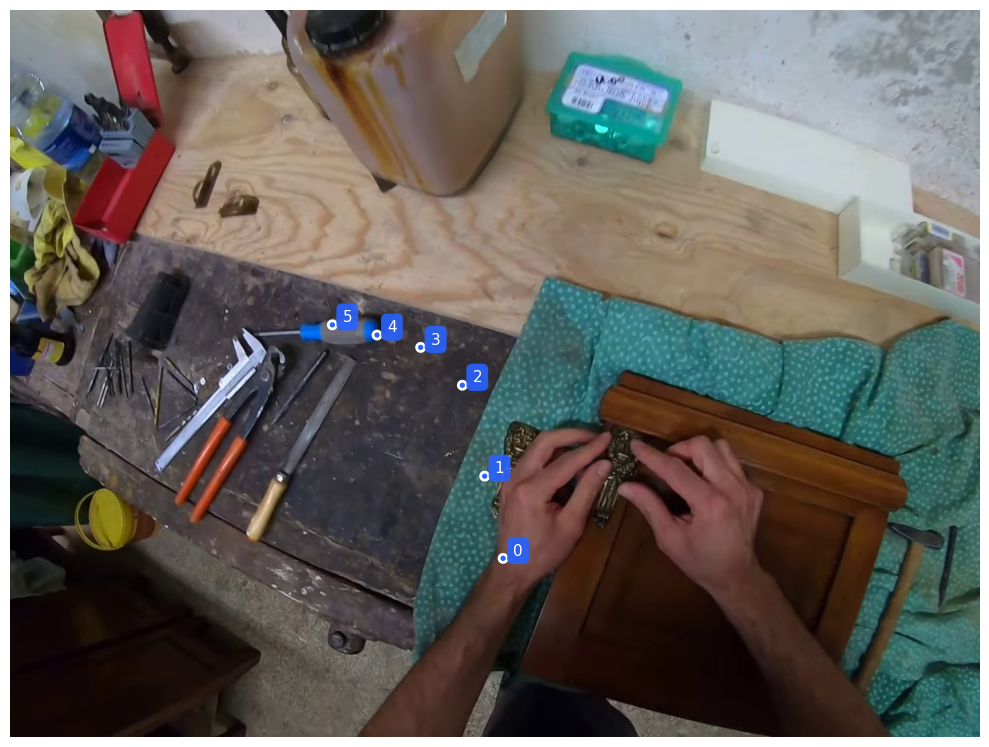

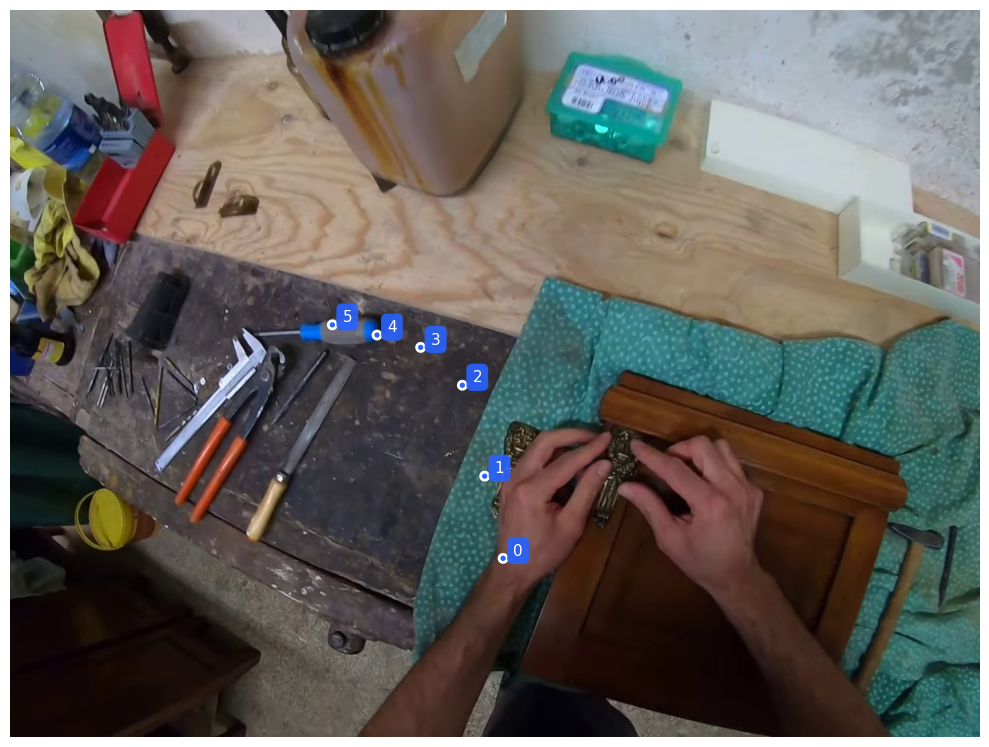

In [154]:
img = Image.open(example_images_dir / "traj_00.jpg")
# img = img.thumbnail((800, 800))

prompt = """
Point to the left hand and the handle of the blue screwdriver, and a trajectory of 6 points connecting them with no more than 10 items.
The points should be labeled by order of the trajectory, from '0' (start point) to <n> (final point)
The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...].
The points are in [y, x] format normalized to 0-1000.
"""

# Analyze the image using Gemini.
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        # Text prompt
        prompt
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates.
print(image_response.text)
# Display the dots on the image
display(generate_point_visualization(img, image_response.text))

#### Trajectories - Example 2

This second example shows how Gemini can predict a list of points that covers an area.

The image used here is from [BridgeData v2](https://rail-berkeley.github.io/bridgedata/) with the license [CC BY 4.0](https://creativecommons.org/licenses/by/4.0/).

In [ ]:
img = Image.open(example_images_dir / "traj_01.jpg")
img = img.thumbnail((800, 800))

prompt = """
Point to the the blue brush and a list of points covering the region of particles with no more than 10 items.
The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...].
The points are in [y, x] format normalized to 0-1000.
"""

# Analyze the image using Gemini.
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        # Text prompt
        prompt
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates.
print(image_response.text)
# Display the dots on the image
display(generate_point_visualization(img, image_response.text))

## Analyzing 3D scenes with Gemini 2.0 (Experimental)

#### Multiview Correspondence
Gemini can reason about different views of the same 3D scene.

In these examples, you first ask Gemini to label some points of interest in a view from a 3d scene. Next, you provide these coordinates and scene view, along with a new view of the same scene, and ask Gemini to point at the same points in the new view.

In these examples, you label the points as letters ('a','b','c' etc.) rather than semantic labels (e.g. 'guitar', 'drum'). This is to force the model to use the coordinates and the image, vs relying on the labels only.

Note that multiview correspondence is an experimental feature, which will further improve in future versions.
This capability works best with the model ID `gemini-2.5-pro-exp-03-25`


##### Musical Instruments step #1: Pointing

In [54]:
PRO_MODEL_ID ='gemini-2.5-pro-exp-03-25'

# Load and resize the image.
img_0 = Image.open(example_images_dir / "music_0.jpg")
img_0 = img_0.resize((800, int(800 * img_0.size[1] / img_0.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini.
# Ask Gemini to point to the musical instruments.
image_response_0 = client.models.generate_content(
    model=PRO_MODEL_ID,
    contents=[
        # The first view of the scene.
        img_0,
        """
          Point to the following points in the image:.
          a. Dumbak top
          b. Dumbak neck
          c. Cajon
          d. Guitar
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000.
          The point labels should be 'a', 'b', 'c' etc. based on the provided list.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates
print(image_response_0.text)

# Display the dots on the image
display(generate_point_visualization(img_0, image_response_0.text))

```json
[
  {"point": [640, 350], "label": "a"},
  {"point": [720, 355], "label": "b"},
  {"point": [544, 408], "label": "c"},
  {"point": [592, 760], "label": "d"}
]
```


NameError: name 'generate_point_visualization' is not defined

##### Musical Instruments step #2: Multiview

Now take a picture from another angle and check if the model can find the corresponding points in the novel view.

In [ ]:
# Load and resize image of a different view of the same scene.
img_1 = Image.open(example_images_dir / "music_1.jpg")
img_1 = img_1.resize((800, int(800 * img_1.size[1] / img_1.size[0])), Image.Resampling.LANCZOS)

image_response_1 = client.models.generate_content(
    model=MODEL_ID,
    contents=[

        # The first view of the scene
        img_0,

        # The new prompt
        """For the following images, predict if the points referenced in the first image are in frame.
        If they are, also predict their 2D coordinates.
        Each entry in the response should be a single line and have the following keys:
        If the point is out of frame: 'in_frame': false, 'label' : <label>.
        If the point is in frame: 'in_frame', 'point', 'label'.""",

        # The coordinates returned by Gemini for the first view, in step #1
        image_response_0.text,

        # A new view of the same scene
        img_1
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates for the new view.
print(image_response_1.text)

# Display the dots on the image
display(generate_point_visualization(img_1, image_response_1.text))

##### Pointing

In [ ]:
# Load and resize the image of a shoe bench.
# img_0 = Image.open("shoe_bench_0.jpg")
img_0 = Image.open(example_images_dir / "shoe_bench_0.jpg")
img_0 = img_0.thumbnail((800, 800))

# Analyze the image using Gemini.
# Ask Gemini to point to several objects on the shoe bench.
image_response_0 = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        # The first view of the scene
        img_0,

        # Text prompt
        """
          Point to the each of the shoes in the image, and the toy jellyfish and backpack:

          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000.
          The point labels should be 'a', 'b', 'c' etc.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates.
print(image_response_0.text)
# Display the dots on the image
display(generate_point_visualization(img_0, image_response_0.text))

##### Shoe Bench step #2: Multiview

Now take a picture from another angle and check if the model can find the corresponding points in the novel view.

In [ ]:
# Load and resize image of a different view of the same scene.
img_1 = Image.open("shoe_bench_1.jpg")
img_1 = img_1.thumbnail((800, 800))

image_response_1 = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        # The first view of the scene.
        img_0,
        """For the following images, predict if the points referenced in the first image are in frame.
        If they are, also predict their 2D coordinates.
        Each entry in the response should be a single line and have the following keys:
        If the point is out of frame: 'in_frame': false, 'label' : <label>.
        If the point is in frame: 'in_frame', 'point', 'label'.""",

        # The coordinates provided by Gemini in step #1.
        image_response_0.text,

        # A new view of the same scene.
        img_1
    ],
    config = types.GenerateContentConfig(
        temperature=0.1
    )
)

# Print the coordinates for the new view.
print(image_response_1.text)

# Display the dots on the image
display(generate_point_visualization(img_1, image_response_1.text))

### Predicting 3D Bounding Boxes

3D bounding boxes is a new experimental feature from Gemini 2.0 that will continue to improve in future models.

To get 3D bounding boxes, you need to tell the model exactly what you need for the output format. This is the recommended one as it's the one the model knows the best.

To prevent the model from repeating itself, it is recommended to use a temperature over 0, in this case 0.5. Limiting the number of items (10 in this case) is also a way to prevent the model from looping and to speed up the decoding of the bounding boxes. You can experiment with these parameters and find what works best for your use-case.

In [ ]:
# Load the selected image
# img = Image.open("kitchen.jpg")
img = Image.open(example_images_dir / "kitchen.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Detect the 3D bounding boxes of no more than 10 items.
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

In [155]:
# @title 3D box visualization code

import IPython
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon
from PIL import Image


def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(
                lines[i + 1 :]
            )  # Remove everything before "```json"
            json_output = json_output.split("```")[
                0
            ]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output


def visualize_3d_boxes(
    pil_image,
    boxes_json,
    fov: float = 60.0,
    zoom: float = 1.5,
    figsize: tuple = (12, 5),
    ego_marker_size: float = 0.5,
    show_grid: bool = True,
    use_distinct_bbox_colors: bool = False,
):
    """
    Draw a static two-panel visualization of 3D bounding boxes,
    with a bo-arrow ego marker and BEV frustum lines.

    Parameters
    ----------
    pil_image : PIL.Image
        Background image for the perspective view.
    boxes_json : str or list
        Either a JSON string or Python list of dicts:
          { 'label': str,
            'box_3d': [cx, cy, cz, sx, sy, sz, roll, pitch, yaw] }
        Here (cx, cy) are lateral/forward coords, so +Y = forward.
    fov : float
        Horizontal field-of-view in degrees.
    zoom : float
        BEV zoom multiplier around your data centre.
    figsize : (w, h)
        Figure size for matplotlib.
    ego_marker_size : float
        Half-width of the little bot arrow in world units.
    show_grid : bool
        Whether to display the grid lines in the BEV view.
    use_distinct_bbox_colors : bool
        If True, use distinct colors for each bounding box instead of the default colors.
    """
    # 1) parse
    boxes = json.loads(boxes_json) if isinstance(boxes_json, str) else boxes_json
    img = np.array(pil_image)
    H, W = img.shape[:2]

    # Generate distinct colors for bounding boxes if requested
    if use_distinct_bbox_colors and len(boxes) > 0:
        # Create visually distinct colors using HSV color space
        import matplotlib.colors as mcolors

        def generate_distinct_colors(n):
            # Generate evenly spaced hues
            HSVs = [(i/n, 0.9, 0.9) for i in range(n)]
            # Convert to RGB
            RGBs = [mcolors.hsv_to_rgb(hsv) for hsv in HSVs]
            return RGBs

        box_colors = generate_distinct_colors(len(boxes))
    else:
        # Default colors
        box_colors = ['cyan'] * len(boxes)  # For perspective view
        bev_colors = ['magenta'] * len(boxes)  # For BEV view

    # 2) helper: project one box into image plane
    def project_to_image(box3d):
        cx, cy, cz, sx, sy, sz, roll, pitch, yaw = box3d
        # build quaternion from rpy
        r,p,y = np.deg2rad([roll, pitch, yaw])
        sr,sp,sy_ = np.sin([r/2,p/2,y/2])
        cr,cp,cy_ = np.cos([r/2,p/2,y/2])
        q = np.array([
            sr*cp*cy_ - cr*sp*sy_,
            cr*sp*cy_ + sr*cp*sy_,
            cr*cp*sy_ - sr*sp*cy_,
            cr*cp*cy_ + sr*sp*sy_
        ])
        R = np.array([
            [1-2*(q[1]**2+q[2]**2), 2*(q[0]*q[1]-q[3]*q[2]), 2*(q[0]*q[2]+q[3]*q[1])],
            [2*(q[0]*q[1]+q[3]*q[2]), 1-2*(q[0]**2+q[2]**2), 2*(q[1]*q[2]-q[3]*q[0])],
            [2*(q[0]*q[2]-q[3]*q[1]), 2*(q[1]*q[2]+q[3]*q[0]), 1-2*(q[0]**2+q[1]**2)]
        ])
        corners = np.array([[x,y,z]
            for x in (-sx/2, sx/2)
            for y in (-sy/2, sy/2)
            for z in (-sz/2, sz/2)])
        order = [1,3,7,5,0,2,6,4]
        pts3d = (R @ corners[order].T).T + np.array([cx, cy, cz])

        # tilt camera down 90° so world‐Y→cam‐Z
        tilt = np.deg2rad(90)
        Rx = np.array([[1,0,0],[0,np.cos(tilt),-np.sin(tilt)],[0,np.sin(tilt),np.cos(tilt)]])
        pts3d = (Rx @ pts3d.T).T

        # intrinsics
        f = W/(2*np.tan(np.deg2rad(fov)/2))
        K = np.array([[f,0,W/2],[0,f,H/2],[0,0,1]])
        proj = (K @ pts3d.T).T
        pts2d = proj[:,:2] / proj[:,2,None]
        depths = pts3d[:,2]
        return pts2d, depths

    # 3) figure out BEV bounds
    xs, ys = [], []
    for b in boxes:
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            print(f"Warning: Box does not have a valid 'box_3d' or '3d' key.")
            continue
        cx,cy,cz,sx,sy,sz,_,_,_ = box_3d
        xs += [cx - sx/2, cx + sx/2]
        ys += [cy - sy/2, cy + sy/2]
    xs.append(0); ys.append(0)
    xmin, xmax = min(xs), max(xs)
    ymin, ymax = min(ys), max(ys)
    dx, dy = max(xmax-xmin, 1e-3), max(ymax-ymin, 1e-3)
    cx_theta, cy_theta = (xmin+xmax)/2, (ymin+ymax)/2
    half_x, half_y = (dx/2)*zoom, (dy/2)*zoom

    # 4) plot
    fig = plt.figure(figsize=figsize)

    # 4a) perspective
    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(img); ax1.axis('off')
    ax1.set_title(f'Perspective (FOV={fov:.0f}°)')

    for i, b in enumerate(boxes):
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            print(f"Warning: Box {i} does not have a valid 'box_3d' or '3d' key.")
            continue

        pts2d, depths = project_to_image(box_3d)
        dmin, dmax = depths.min(), depths.max()
        # Use the generated color if distinct colors are requested
        color = box_colors[i] if use_distinct_bbox_colors else 'cyan'

        for j in range(4):
            # top
            x0,y0 = pts2d[j]; x1,y1 = pts2d[(j+1)%4]
            w = 4 - ((depths[j]+depths[(j+1)%4])/2 - dmin)/(dmax-dmin)*3
            ax1.add_line(Line2D([x0,x1],[y0,y1], lw=w, color=color))
            # bottom
            bx0,by0 = pts2d[j+4]; bx1,by1 = pts2d[(j+1)%4+4]
            w2 = 4 - ((depths[j+4]+depths[(j+1)%4+4])/2 - dmin)/(dmax-dmin)*3
            ax1.add_line(Line2D([bx0,bx1],[by0,by1], lw=w2, color=color))
            # vertical
            ax1.add_line(Line2D([x0,bx0],[y0,by0], lw=w, color=color))
        # label
        cx2, cy2 = pts2d.mean(axis=0)
        bbox_color = color if use_distinct_bbox_colors else 'blue'
        ax1.text(cx2, cy2, b['label'],
                 color='white', ha='center', va='center',
                 bbox=dict(facecolor=bbox_color, alpha=0.6, pad=2))

    # 4b) BEV
    ax2 = fig.add_subplot(1,2,2)
    ax2.set_aspect('equal')
    ax2.set_title(f'Top View (zoom={zoom:.1f}×)')
    ax2.set_xlim(cx_theta-half_x, cx_theta+half_x)
    ax2.set_ylim(cy_theta-half_y, cy_theta+half_y)

    # Add grid only if show_grid is True
    if show_grid:
        # grid
        xt = np.arange(np.floor(cx_theta-half_x), np.ceil(cx_theta+half_x)+1)
        yt = np.arange(np.floor(cy_theta-half_y), np.ceil(cy_theta+half_y)+1)
        for x in xt: ax2.axvline(x, color='gray', lw=0.5)
        for y in yt: ax2.axhline(y, color='gray', lw=0.5)

    # 4c) frustum rays
    theta = np.deg2rad(fov/2)
    end_dist = cy_theta + half_y
    for sign in (+1, -1):
        dx = np.sin(sign*theta) * end_dist
        dy = np.cos(theta)       * end_dist
        ax2.plot([0, dx], [0, dy], '--', color='blue', lw=1.5)

    # 4d) ego marker as up‐triangle
    ax2.scatter(0, 0,
                marker='^',
                s=(ego_marker_size*200)**2,
                color='black',
                zorder=5)
    ax2.text(0, - ego_marker_size*3, 'Ego',
             color='black', ha='center', va='top',
             fontsize=9, weight='bold')

    # 4e) draw box footprints
    for i, b in enumerate(boxes):
        cx,cy,cz,sx,sy,sz,roll,pitch,yaw = b['box_3d']
        phi = np.deg2rad(yaw)
        Rz = np.array([[ np.cos(phi), -np.sin(phi)],
                       [ np.sin(phi),  np.cos(phi)]])
        rect = np.array([[-sx/2,-sy/2],
                         [ sx/2,-sy/2],
                         [ sx/2, sy/2],
                         [-sx/2, sy/2]]) @ Rz.T
        rect += np.array([cx, cy])

        # Use the generated color or default to magenta
        bev_color = box_colors[i] if use_distinct_bbox_colors else 'magenta'

        ax2.add_patch(plt.Polygon(rect, closed=True,
                                  fill=False,
                                  edgecolor=bev_color,
                                  lw=2))
        ax2.text(cx, cy, b['label'],
                 color='white', ha='center', va='center',
                 bbox=dict(facecolor=bev_color, alpha=0.6, pad=2))

    plt.tight_layout()
    plt.show()

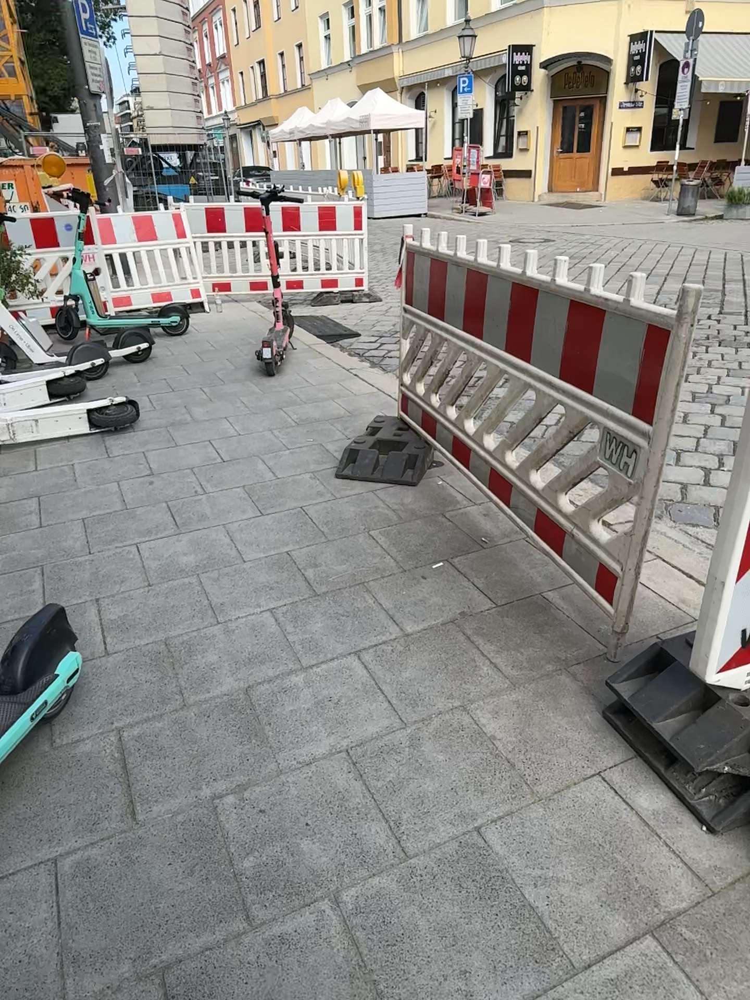

In [156]:
Image.fromarray(ds.get_rgb(300))


### Search within the image

Like when using [Search within image](../quickstarts/Spatial_understanding.ipynb#scrollTo=wjP8ktS62QRv) in 2D, you can also ask Gemini to find specific objects in your images. It helps it to focus on what you are interested in instead of everything it sees (because it sees a lot!).# Use the updated function with new parameters - fix the duplicate show_grid parametervisualize_3d_boxes(img, json_response, figsize=(12, 5), show_grid=True, ego_marker_size=0.1, use_distinct_bbox_colors=True)

AFC is enabled with max remote calls: 10.
HTTP Request: POST https://generativelanguage.googleapis.com/v1beta/models/gemini-2.5-flash-preview-04-17:generateContent "HTTP/1.1 200 OK"
AFC remote call 1 is done.
```json
[
  {"box_2d": [219, 529, 626, 918], "mask": "", "label": "construction barrier"},
  {"box_2d": [187, 323, 377, 400], "mask": "", "label": "e-scooter"},
  {"box_2d": [187, 65, 343, 271], "mask": "", "label": "e-scooter"},
  {"box_2d": [201, 109, 316, 509], "mask": "", "label": "construction barrier"},
  {"box_2d": [300, 0, 404, 150], "mask": "", "label": "e-scooter"},
  {"box_2d": [603, 0, 764, 109], "mask": "", "label": "e-scooter"},
  {"box_2d": [396, 0, 447, 189], "mask": "", "label": "e-scooter"},
  {"box_2d": [83, 601, 153, 636], "mask": "", "label": "parking sign"}
]
```

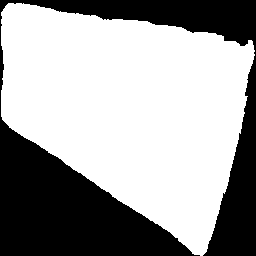
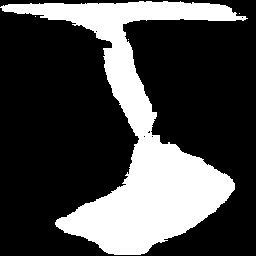
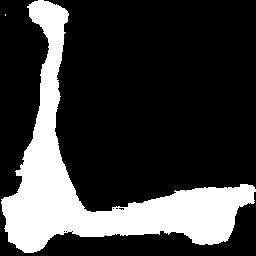
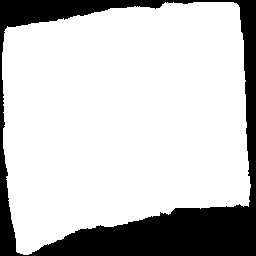
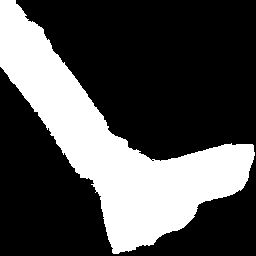
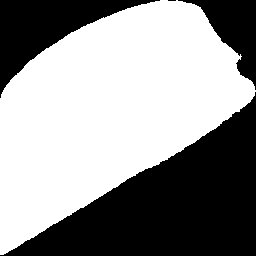
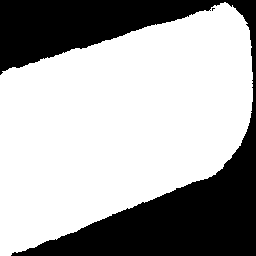
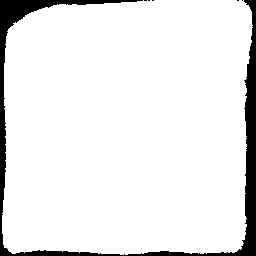

In [122]:
# Semantic segmentation

MODEL_ID = "gemini-2.5-flash-preview-04-17"

# Load the selected image
img = Image.fromarray(ds.get_rgb(300))

# Analyze the image using Gemini for semantic segmentation
image_response_segmentation = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
        """
          Give the segmentation masks for all objects that are relevant in the context of a scene description to guide visually impaired users.
          Output a JSON list of segmentation masks where each entry contains the 2D
          bounding box in the key "box_2d", the segmentation mask in key "mask", and
          the text label in the key "label". Use descriptive labels.
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

print(image_response_segmentation.text)

In [123]:
# @title Segmentation Utils

import dataclasses
import numpy as np
import base64
from PIL import Image
import io
from typing import Tuple
from PIL import ImageColor
import json
from PIL import ImageDraw

@dataclasses.dataclass(frozen=True)
class SegmentationMask:
  # bounding box pixel coordinates (not normalized)
  y0: int # in [0..height - 1]
  x0: int # in [0..width - 1]
  y1: int # in [0..height - 1]
  x1: int # in [0..width - 1]
  mask: np.array # [img_height, img_width] with values 0..255
  label: str

def parse_segmentation_masks(
    predicted_str: str, *, img_height: int, img_width: int
) -> list[SegmentationMask]:
  items = json.loads(parse_json(predicted_str))
  masks = []
  for item in items:
    raw_box = item["box_2d"]
    abs_y0 = int(item["box_2d"][0] / 1000 * img_height)
    abs_x0 = int(item["box_2d"][1] / 1000 * img_width)
    abs_y1 = int(item["box_2d"][2] / 1000 * img_height)
    abs_x1 = int(item["box_2d"][3] / 1000 * img_width)
    if abs_y0 >= abs_y1 or abs_x0 >= abs_x1:
      print("Invalid bounding box", item["box_2d"])
      continue
    label = item["label"]
    png_str = item["mask"]
    if not png_str.startswith("data:image/png;base64,"):
      print("Invalid mask")
      continue
    png_str = png_str.removeprefix("data:image/png;base64,")
    png_str = base64.b64decode(png_str)
    mask = Image.open(io.BytesIO(png_str))
    bbox_height = abs_y1 - abs_y0
    bbox_width = abs_x1 - abs_x0
    if bbox_height < 1 or bbox_width < 1:
      print("Invalid bounding box")
      continue
    mask = mask.resize((bbox_width, bbox_height), resample=Image.Resampling.BILINEAR)
    np_mask = np.zeros((img_height, img_width), dtype=np.uint8)
    np_mask[abs_y0:abs_y1, abs_x0:abs_x1] = mask
    masks.append(SegmentationMask(abs_y0, abs_x0, abs_y1, abs_x1, np_mask, label))
  return masks

def overlay_mask_on_img(
    img: Image,
    mask: np.ndarray,
    color: str,
    alpha: float = 0.7
) -> Image.Image:
    """
    Overlays a single mask onto a PIL Image using a named color.

    The mask image defines the area to be colored. Non-zero pixels in the
    mask image are considered part of the area to overlay.

    Args:
        img: The base PIL Image object.
        mask: A PIL Image object representing the mask.
              Should have the same height and width as the img.
              Modes '1' (binary) or 'L' (grayscale) are typical, where
              non-zero pixels indicate the masked area.
        color: A standard color name string (e.g., 'red', 'blue', 'yellow').
        alpha: The alpha transparency level for the overlay (0.0 fully
               transparent, 1.0 fully opaque). Default is 0.7 (70%).

    Returns:
        A new PIL Image object (in RGBA mode) with the mask overlaid.

    Raises:
        ValueError: If color name is invalid, mask dimensions mismatch img
                    dimensions, or alpha is outside the 0.0-1.0 range.
    """
    if not (0.0 <= alpha <= 1.0):
        raise ValueError("Alpha must be between 0.0 and 1.0")

    # Convert the color name string to an RGB tuple
    try:
        color_rgb: Tuple[int, int, int] = ImageColor.getrgb(color)
    except ValueError as e:
        # Re-raise with a more informative message if color name is invalid
        raise ValueError(f"Invalid color name '{color}'. Supported names are typically HTML/CSS color names. Error: {e}")

    # Prepare the base image for alpha compositing
    img_rgba = img.convert("RGBA")
    width, height = img_rgba.size

    # Create the colored overlay layer
    # Calculate the RGBA tuple for the overlay color
    alpha_int = int(alpha * 255)
    overlay_color_rgba = color_rgb + (alpha_int,)

    # Create an RGBA layer (all zeros = transparent black)
    colored_mask_layer_np = np.zeros((height, width, 4), dtype=np.uint8)

    # Mask has values between 0 and 255, threshold at 127 to get binary mask.
    mask_np_logical = mask > 127

    # Apply the overlay color RGBA tuple where the mask is True
    colored_mask_layer_np[mask_np_logical] = overlay_color_rgba

    # Convert the NumPy layer back to a PIL Image
    colored_mask_layer_pil = Image.fromarray(colored_mask_layer_np, 'RGBA')

    # Composite the colored mask layer onto the base image
    result_img = Image.alpha_composite(img_rgba, colored_mask_layer_pil)

    return result_img

def plot_segmentation_masks(img: Image, segmentation_masks: list[SegmentationMask]):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img: The PIL.Image.
        segmentation_masks: A string encoding as JSON a list of segmentation masks containing the name of the object,
         their positions in normalized [y1 x1 y2 x2] format, and the png encoded segmentation mask.
    """
    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ]
    # font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)

    # Do this in 3 passes to make sure the boxes and text are always visible.

    # Overlay the mask
    for i, mask in enumerate(segmentation_masks):
      color = colors[i % len(colors)]
      img = overlay_mask_on_img(img, mask.mask, color)

    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Draw the bounding boxes
    for i, mask in enumerate(segmentation_masks):
      color = colors[i % len(colors)]
      draw.rectangle(
          ((mask.x0, mask.y0), (mask.x1, mask.y1)), outline=color, width=4
      )

    # Draw the text labels
    for i, mask in enumerate(segmentation_masks):
      color = colors[i % len(colors)]
      if mask.label != "":
        draw.text((mask.x0 + 8, mask.y0 - 20), mask.label, fill=color)
    return img

In [ ]:
# @title Enhanced Segmentation Utils

import dataclasses
import numpy as np
import base64
from PIL import Image, ImageFont
import io
from typing import Tuple, List, Optional
import json
from PIL import ImageColor, ImageDraw
import matplotlib.pyplot as plt

@dataclasses.dataclass(frozen=True)
class SegmentationMask:
    """
    Represents a segmentation mask with bounding box coordinates and label.

    Attributes:
        y0: Top coordinate (pixels)
        x0: Left coordinate (pixels)
        y1: Bottom coordinate (pixels)
        x1: Right coordinate (pixels)
        mask: Binary mask as numpy array [height, width] with values 0-255
        label: Text label for the mask
    """
    y0: int  # in [0..height - 1]
    x0: int  # in [0..width - 1]
    y1: int  # in [0..height - 1]
    x1: int  # in [0..width - 1]
    mask: np.ndarray  # [img_height, img_width] with values 0..255
    label: str

def parse_json(json_output: str) -> str:
    """
    Clean JSON string from markdown code blocks.

    Args:
        json_output: Raw JSON string potentially inside markdown code blocks

    Returns:
        Cleaned JSON string
    """
    # Handle case where there's no JSON to parse
    if not json_output or json_output.isspace():
        return "{}"

    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line.strip() == "```json" or line.strip() == "```":
            json_output = "\n".join(lines[i+1:])  # Remove everything before marker
            if "```" in json_output:
                json_output = json_output.split("```")[0]  # Remove everything after closing
            break

    return json_output

def parse_segmentation_masks(
    predicted_str: str, *, img_height: int, img_width: int
) -> List[SegmentationMask]:
    """
    Parse JSON string containing segmentation masks into SegmentationMask objects.

    Args:
        predicted_str: JSON string containing segmentation data
        img_height: Height of the original image in pixels
        img_width: Width of the original image in pixels

    Returns:
        List of SegmentationMask objects
    """
    try:
        # Parse the cleaned JSON
        cleaned_json = parse_json(predicted_str)
        items = json.loads(cleaned_json)

        # Validate the parsed data is a list
        if not isinstance(items, list):
            print(f"Invalid JSON format: expected a list, got {type(items)}")
            return []

        masks = []
        for i, item in enumerate(items):
            try:
                # Check required keys exist
                if not all(key in item for key in ["box_2d", "mask", "label"]):
                    print(f"Item {i} missing required fields (box_2d, mask, label)")
                    continue

                # Extract and normalize bounding box coordinates
                raw_box = item["box_2d"]
                if len(raw_box) != 4:
                    print(f"Invalid bounding box format: {raw_box}")
                    continue

                abs_y0 = int(raw_box[0] / 1000 * img_height)
                abs_x0 = int(raw_box[1] / 1000 * img_width)
                abs_y1 = int(raw_box[2] / 1000 * img_height)
                abs_x1 = int(raw_box[3] / 1000 * img_width)

                # Validate bounding box
                if abs_y0 >= abs_y1 or abs_x0 >= abs_x1:
                    print(f"Invalid bounding box dimensions: {raw_box}")
                    continue

                # Get label
                label = item["label"]

                # Process mask data
                png_str = item["mask"]
                if not isinstance(png_str, str) or not png_str.startswith("data:image/png;base64,"):
                    print(f"Invalid mask format for item {i}")
                    continue

                # Remove prefix and decode base64
                png_str = png_str.removeprefix("data:image/png;base64,")
                try:
                    png_bytes = base64.b64decode(png_str)
                    mask_img = Image.open(io.BytesIO(png_bytes))
                except Exception as e:
                    print(f"Error decoding mask for {label}: {e}")
                    continue

                # Resize mask to fit bounding box
                bbox_height = abs_y1 - abs_y0
                bbox_width = abs_x1 - abs_x0
                if bbox_height < 1 or bbox_width < 1:
                    print(f"Bounding box too small: {bbox_width}x{bbox_height}")
                    continue

                # Resize with antialiasing for better quality
                mask = mask_img.resize((bbox_width, bbox_height),
                                       resample=Image.Resampling.LANCZOS)

                # Create full-size mask
                np_mask = np.zeros((img_height, img_width), dtype=np.uint8)
                np_mask[abs_y0:abs_y1, abs_x0:abs_x1] = np.array(mask)

                # Create and add the segmentation mask
                masks.append(SegmentationMask(
                    abs_y0, abs_x0, abs_y1, abs_x1, np_mask, label))

            except Exception as e:
                print(f"Error processing item {i}: {e}")
                continue

        return masks

    except json.JSONDecodeError as e:
        print(f"JSON parsing error: {e}")
        return []
    except Exception as e:
        print(f"Unexpected error: {e}")
        return []

def overlay_mask_on_img(
    img: Image.Image,
    mask: np.ndarray,
    color: str,
    alpha: float = 0.7,
) -> Image.Image:
    """
    Overlays a mask onto an image with improved edge rendering.

    Args:
        img: Base PIL Image
        mask: Numpy array mask [height, width] with values 0-255
        color: Color name or hex string
        alpha: Opacity level (0.0-1.0)

    Returns:
        PIL Image with mask overlay
    """
    if not (0.0 <= alpha <= 1.0):
        raise ValueError("Alpha must be between 0.0 and 1.0")

    # Convert color string to RGB tuple
    try:
        color_rgb = ImageColor.getrgb(color)
    except ValueError as e:
        raise ValueError(f"Invalid color '{color}': {e}")

    # Prepare for alpha compositing
    img_rgba = img.convert("RGBA")
    width, height = img_rgba.size

    # Create mask overlay
    alpha_int = int(alpha * 255)
    overlay_color_rgba = color_rgb + (alpha_int,)
    colored_mask_layer = np.zeros((height, width, 4), dtype=np.uint8)

    # Apply basic mask
    mask_binary = mask > 127
    colored_mask_layer[mask_binary] = overlay_color_rgba

    # Convert to PIL and composite
    mask_layer_pil = Image.fromarray(colored_mask_layer, 'RGBA')
    result_img = Image.alpha_composite(img_rgba, mask_layer_pil)

    return result_img

def find_optimal_label_position(mask: SegmentationMask, width: int, height: int) -> Tuple[int, int]:
    """
    Calculate an optimal position for label placement.

    Args:
        mask: SegmentationMask object
        width: Image width
        height: Image height

    Returns:
        (x, y) coordinates for label placement
    """
    # Use mask centroid if possible
    mask_indices = np.where(mask.mask > 127)
    if len(mask_indices[0]) > 0:
        # Get centroid of mask
        y_center = int(np.mean(mask_indices[0]))
        x_center = int(np.mean(mask_indices[1]))
    else:
        # Fall back to bounding box center
        y_center = (mask.y0 + mask.y1) // 2
        x_center = (mask.x0 + mask.x1) // 2

    # Keep within image bounds with margins
    x_center = max(5, min(width - 5, x_center))
    y_center = max(20, min(height - 5, y_center))

    return x_center, y_center

def plot_segmentation_masks(
    img: Image.Image,
    segmentation_masks: List[SegmentationMask],
    alpha: float = 0.45,
    show_boxes: bool = True,
    line_width: int = 4,
    font_size: int = 24,  # Added font size parameter with default value
) -> Image.Image:
    """
    Draw segmentation masks, bounding boxes and labels on an image.

    Args:
        img: Input PIL Image
        segmentation_masks: List of SegmentationMask objects
        alpha: Opacity level for masks (0.0-1.0)
        show_boxes: Whether to draw bounding boxes
        line_width: Width of bounding box lines
        font_size: Size of the font for labels (default: 16)

    Returns:
        PIL Image with all visualizations applied
    """
    # Make a copy of the image to avoid modifying the original
    result_img = img.copy()
    width, height = img.size

    # Use predefined color list (keeping original colors)
    colors = [
        'red', 'green', 'blue', 'yellow', 'orange', 'pink', 'purple',
        'brown', 'gray', 'beige', 'turquoise', 'cyan', 'magenta', 'lime',
        'navy', 'maroon', 'teal', 'olive', 'coral', 'lavender', 'violet',
        'gold', 'silver'
    ]

    # Apply masks first (background layer)
    for i, mask in enumerate(segmentation_masks):
        color = colors[i % len(colors)]
        result_img = overlay_mask_on_img(
            result_img, mask.mask, color, alpha)

    # Create drawing object for boxes and text
    draw = ImageDraw.Draw(result_img)

    # Try to create a font with the specified size
    try:
        font = ImageFont.truetype("Arial", font_size)
    except IOError:
        # Fall back to default font if Arial is not available
        font = ImageFont.load_default()

    # Draw bounding boxes if requested
    if show_boxes:
        for i, mask in enumerate(segmentation_masks):
            color = colors[i % len(colors)]
            # Calculate line width proportional to image size for consistency
            actual_width = max(1, min(line_width, int(width/200)))
            draw.rectangle(
                ((mask.x0, mask.y0), (mask.x1, mask.y1)),
                outline=color,
                width=actual_width
            )

    # Draw labels last (foreground layer)
    for i, mask in enumerate(segmentation_masks):
        if not mask.label:
            continue

        color = colors[i % len(colors)]

        # Find optimal label position
        x_pos, y_pos = find_optimal_label_position(mask, width, height)

        # Measure text for background using the specified font
        text_bbox = draw.textbbox((x_pos, y_pos), mask.label, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]

        # Draw text background
        draw.rectangle(
            (x_pos-2, y_pos-2, x_pos+text_width+2, y_pos+text_height+2),
            fill=color
        )

        # Draw text in white for visibility with specified font size
        draw.text((x_pos, y_pos), mask.label, fill="white", font=font)


    return result_img


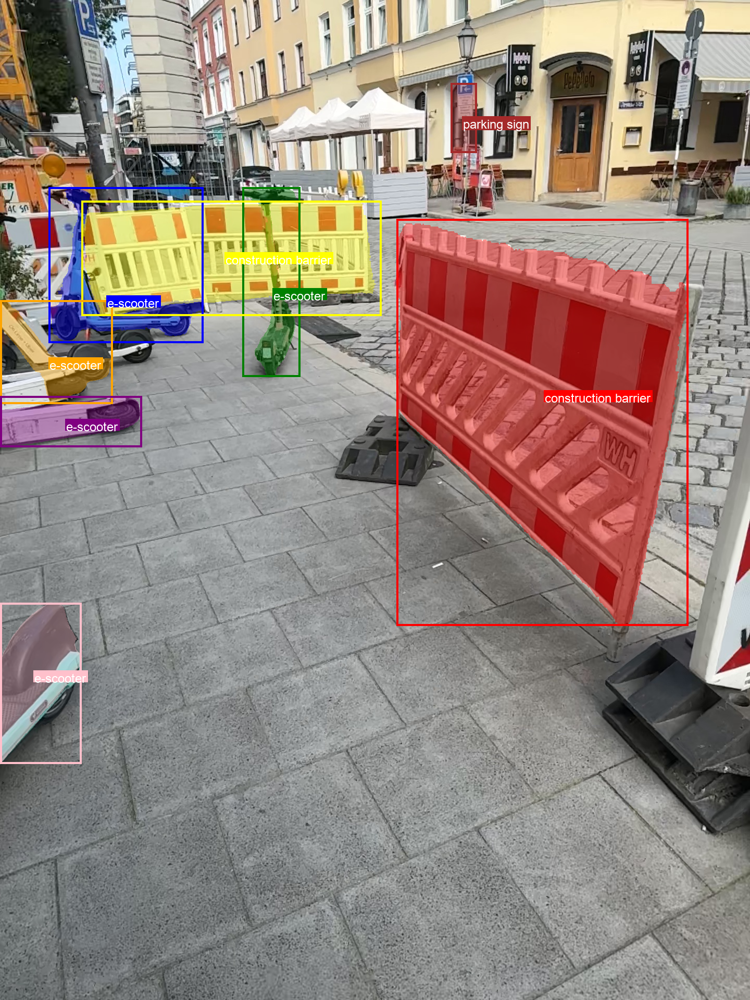

In [ ]:
segmentation_masks = parse_segmentation_masks(image_response_segmentation.text, img_height=img.size[1], img_width=img.size[0])
plot_segmentation_masks(img, segmentation_masks, alpha=0.4, font_size=24)

In [145]:
import dataclasses
import numpy as np
import base64
import json
import io
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon
from PIL import Image, ImageDraw, ImageFont, ImageColor
from typing import Tuple, List, Optional
from google.genai import types

# Parse JSON output from model response
def parse_json(json_output: str) -> str:
    """Clean JSON string from markdown code blocks."""
    # Handle case where there's no JSON to parse
    if not json_output or json_output.isspace():
        return "{}"

    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line.strip() == "```json" or line.strip() == "```":
            json_output = "\n".join(lines[i+1:])  # Remove everything before marker
            if "```" in json_output:
                json_output = json_output.split("```")[0]  # Remove everything after closing
            break

    return json_output

@dataclasses.dataclass(frozen=True)
class SegmentationMask:
    """Represents a segmentation mask with bounding box coordinates and label."""
    y0: int  # in [0..height - 1]
    x0: int  # in [0..width - 1]
    y1: int  # in [0..height - 1]
    x1: int  # in [0..width - 1]
    mask: np.ndarray  # [img_height, img_width] with values 0..255
    label: str

def parse_segmentation_masks(
    predicted_str: str, *, img_height: int, img_width: int
) -> List[SegmentationMask]:
    """Parse JSON string containing segmentation masks into SegmentationMask objects."""
    try:
        # Parse the cleaned JSON
        items = json.loads(predicted_str)

        # Check if segmentation data is in the expected format
        if "segmentation" in items:
            items = items["segmentation"]

        # Validate the parsed data is a list
        if not isinstance(items, list):
            print(f"Invalid JSON format for segmentation: expected a list, got {type(items)}")
            return []

        masks = []
        for i, item in enumerate(items):
            try:
                # Check required keys exist
                if not all(key in item for key in ["box_2d", "mask", "label"]):
                    print(f"Item {i} missing required fields (box_2d, mask, label)")
                    continue

                # Extract and normalize bounding box coordinates
                raw_box = item["box_2d"]
                if len(raw_box) != 4:
                    print(f"Invalid bounding box format: {raw_box}")
                    continue

                abs_y0 = int(raw_box[0] / 1000 * img_height)
                abs_x0 = int(raw_box[1] / 1000 * img_width)
                abs_y1 = int(raw_box[2] / 1000 * img_height)
                abs_x1 = int(raw_box[3] / 1000 * img_width)

                # Validate bounding box
                if abs_y0 >= abs_y1 or abs_x0 >= abs_x1:
                    print(f"Invalid bounding box dimensions: {raw_box}")
                    continue

                # Get label
                label = item["label"]

                # Process mask data
                png_str = item["mask"]
                if not isinstance(png_str, str) or not png_str.startswith("data:image/png;base64,"):
                    print(f"Invalid mask format for item {i}")
                    continue

                # Remove prefix and decode base64
                png_str = png_str.removeprefix("data:image/png;base64,")
                try:
                    png_bytes = base64.b64decode(png_str)
                    mask_img = Image.open(io.BytesIO(png_bytes))
                except Exception as e:
                    print(f"Error decoding mask for {label}: {e}")
                    continue

                # Resize mask to fit bounding box
                bbox_height = abs_y1 - abs_y0
                bbox_width = abs_x1 - abs_x0
                if bbox_height < 1 or bbox_width < 1:
                    print(f"Bounding box too small: {bbox_width}x{bbox_height}")
                    continue

                # Resize with antialiasing for better quality
                mask = mask_img.resize((bbox_width, bbox_height),
                                       resample=Image.Resampling.LANCZOS)

                # Create full-size mask
                np_mask = np.zeros((img_height, img_width), dtype=np.uint8)
                np_mask[abs_y0:abs_y1, abs_x0:abs_x1] = np.array(mask)

                # Create and add the segmentation mask
                masks.append(SegmentationMask(
                    abs_y0, abs_x0, abs_y1, abs_x1, np_mask, label))

            except Exception as e:
                print(f"Error processing item {i}: {e}")
                continue

        return masks

    except json.JSONDecodeError as e:
        print(f"JSON parsing error for segmentation: {e}")
        return []
    except Exception as e:
        print(f"Unexpected error parsing segmentation: {e}")
        return []

def parse_3d_boxes(predicted_str: str):
    """Parse JSON string containing 3D boxes."""
    try:
        # Parse the JSON
        items = json.loads(predicted_str)

        # Check if boxes data is in the expected format
        if "boxes_3d" in items:
            boxes = items["boxes_3d"]
            return boxes

        return []  # Return empty list if no boxes found

    except json.JSONDecodeError as e:
        print(f"JSON parsing error for 3D boxes: {e}")
        return []
    except Exception as e:
        print(f"Unexpected error parsing 3D boxes: {e}")
        return []

def overlay_mask_on_img(
    img: Image.Image,
    mask: np.ndarray,
    color: str,
    alpha: float = 0.5,
) -> Image.Image:
    """Overlays a mask onto an image with improved edge rendering."""
    if not (0.0 <= alpha <= 1.0):
        raise ValueError("Alpha must be between 0.0 and 1.0")

    # Convert color string to RGB tuple
    try:
        color_rgb = ImageColor.getrgb(color)
    except ValueError as e:
        raise ValueError(f"Invalid color '{color}': {e}")

    # Prepare for alpha compositing
    img_rgba = img.convert("RGBA")
    width, height = img_rgba.size

    # Create mask overlay
    alpha_int = int(alpha * 255)
    overlay_color_rgba = color_rgb + (alpha_int,)
    colored_mask_layer = np.zeros((height, width, 4), dtype=np.uint8)

    # Apply basic mask
    mask_binary = mask > 127
    colored_mask_layer[mask_binary] = overlay_color_rgba

    # Convert to PIL and composite
    mask_layer_pil = Image.fromarray(colored_mask_layer, 'RGBA')
    result_img = Image.alpha_composite(img_rgba, mask_layer_pil)

    return result_img

def visualize_3d_boxes_with_segmentation(
    pil_image: Image.Image,
    segmentation_masks: List[SegmentationMask],
    boxes_3d: List[dict],
    fov: float = 60.0,
    zoom: float = 1.5,
    figsize: tuple = (15, 7),
    ego_marker_size: float = 0.5,
    show_grid: bool = True,
    use_distinct_bbox_colors: bool = True,
    alpha: float = 0.4
):
    """
    Combined visualization showing both segmentation masks and 3D bounding boxes.

    Parameters:
    -----------
    pil_image: PIL.Image
        The input image
    segmentation_masks: List[SegmentationMask]
        Segmentation masks to overlay
    boxes_3d: List[dict]
        List of 3D bounding boxes
    fov: float
        Horizontal field-of-view in degrees
    zoom: float
        BEV zoom multiplier
    figsize: tuple
        Figure size for matplotlib
    ego_marker_size: float
        Size of the ego marker in BEV
    show_grid: bool
        Whether to show grid in BEV
    use_distinct_bbox_colors: bool
        Use distinct colors for boxes
    alpha: float
        Opacity for segmentation masks
    """
    # Parse the 3D boxes
    boxes = boxes_3d
    img_np = np.array(pil_image)
    H, W = img_np.shape[:2]

    # Generate distinct colors
    import matplotlib.colors as mcolors
    def generate_distinct_colors(n):
        HSVs = [(i/n, 0.9, 0.9) for i in range(n)]
        RGBs = [mcolors.hsv_to_rgb(hsv) for hsv in HSVs]
        return RGBs

    # Use same colors for both segmentation and 3D boxes for consistency
    num_colors = max(len(segmentation_masks), len(boxes))
    distinct_colors = generate_distinct_colors(num_colors) if num_colors > 0 else []

    # Apply segmentation masks to the image
    result_img = pil_image.copy()
    for i, mask in enumerate(segmentation_masks):
        color_rgb = distinct_colors[i % len(distinct_colors)] if distinct_colors else [1.0, 0.0, 0.0]
        color_hex = f'#{int(color_rgb[0]*255):02x}{int(color_rgb[1]*255):02x}{int(color_rgb[2]*255):02x}'
        result_img = overlay_mask_on_img(result_img, mask.mask, color_hex, alpha)

    # Helper function: project box into image plane
    def project_to_image(box3d):
        cx, cy, cz, sx, sy, sz, roll, pitch, yaw = box3d
        # build quaternion from rpy
        r,p,y = np.deg2rad([roll, pitch, yaw])
        sr,sp,sy_ = np.sin([r/2,p/2,y/2])
        cr,cp,cy_ = np.cos([r/2,p/2,y/2])
        q = np.array([
            sr*cp*cy_ - cr*sp*sy_,
            cr*sp*cy_ + sr*cp*sy_,
            cr*cp*sy_ - sr*sp*cy_,
            cr*cp*cy_ + sr*sp*sy_
        ])
        R = np.array([
            [1-2*(q[1]**2+q[2]**2), 2*(q[0]*q[1]-q[3]*q[2]), 2*(q[0]*q[2]+q[3]*q[1])],
            [2*(q[0]*q[1]+q[3]*q[2]), 1-2*(q[0]**2+q[2]**2), 2*(q[1]*q[2]-q[3]*q[0])],
            [2*(q[0]*q[2]-q[3]*q[1]), 2*(q[1]*q[2]+q[3]*q[0]), 1-2*(q[0]**2+q[1]**2)]
        ])
        corners = np.array([[x,y,z]
            for x in (-sx/2, sx/2)
            for y in (-sy/2, sy/2)
            for z in (-sz/2, sz/2)])
        order = [1,3,7,5,0,2,6,4]
        pts3d = (R @ corners[order].T).T + np.array([cx, cy, cz])

        # tilt camera down 90° so world‐Y→cam‐Z
        tilt = np.deg2rad(90)
        Rx = np.array([[1,0,0],[0,np.cos(tilt),-np.sin(tilt)],[0,np.sin(tilt),np.cos(tilt)]])
        pts3d = (Rx @ pts3d.T).T

        # intrinsics
        f = W/(2*np.tan(np.deg2rad(fov)/2))
        K = np.array([[f,0,W/2],[0,f,H/2],[0,0,1]])
        proj = (K @ pts3d.T).T
        pts2d = proj[:,:2] / proj[:,2,None]
        depths = pts3d[:,2]
        return pts2d, depths

    # 3) figure out BEV bounds
    xs, ys = [], []
    for b in boxes:
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            continue
        cx,cy,cz,sx,sy,sz,_,_,_ = box_3d
        xs += [cx - sx/2, cx + sx/2]
        ys += [cy - sy/2, cy + sy/2]
    xs.append(0); ys.append(0)

    # Default BEV bounds if no boxes
    if len(xs) <= 1:
        xmin, xmax = -5, 5
        ymin, ymax = -5, 5
    else:
        xmin, xmax = min(xs), max(xs)
        ymin, ymax = min(ys), max(ys)

    dx, dy = max(xmax-xmin, 1e-3), max(ymax-ymin, 1e-3)
    cx_theta, cy_theta = (xmin+xmax)/2, (ymin+ymax)/2
    half_x, half_y = (dx/2)*zoom, (dy/2)*zoom

    # Create a figure with two subplots side by side
    fig = plt.figure(figsize=figsize)

    # Left subplot: Image with segmentation and 3D boxes
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.imshow(np.array(result_img))
    ax1.set_title('Image with Segmentation & 3D Boxes')
    ax1.axis('off')

    # Draw 3D bounding boxes on the image with segmentation
    for i, b in enumerate(boxes):
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            continue

        pts2d, depths = project_to_image(box_3d)
        dmin, dmax = depths.min(), depths.max()

        # Use the distinct color
        color = f'#{int(distinct_colors[i % len(distinct_colors)][0]*255):02x}{int(distinct_colors[i % len(distinct_colors)][1]*255):02x}{int(distinct_colors[i % len(distinct_colors)][2]*255):02x}' if distinct_colors else '#00FFFF'

        for j in range(4):
            # top
            x0,y0 = pts2d[j]; x1,y1 = pts2d[(j+1)%4]
            w = 4 - ((depths[j]+depths[(j+1)%4])/2 - dmin)/(dmax-dmin)*3 if dmax > dmin else 4
            ax1.add_line(Line2D([x0,x1],[y0,y1], lw=w, color=color))
            # bottom
            bx0,by0 = pts2d[j+4]; bx1,by1 = pts2d[(j+1)%4+4]
            w2 = 4 - ((depths[j+4]+depths[(j+1)%4+4])/2 - dmin)/(dmax-dmin)*3 if dmax > dmin else 4
            ax1.add_line(Line2D([bx0,bx1],[by0,by1], lw=w2, color=color))
            # vertical
            ax1.add_line(Line2D([x0,bx0],[y0,by0], lw=w, color=color))

        # Label with background color matching the box
        cx2, cy2 = pts2d.mean(axis=0)
        ax1.text(cx2, cy2, b['label'],
                color='white', ha='center', va='center', fontsize=9,
                bbox=dict(facecolor=color, alpha=0.7, pad=2))

    # Right subplot: Bird's eye view
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.set_aspect('equal')
    ax2.set_title(f'Bird\'s Eye View (zoom={zoom:.1f}×)')
    ax2.set_xlim(cx_theta-half_x, cx_theta+half_x)
    ax2.set_ylim(cy_theta-half_y, cy_theta+half_y)

    # Add grid
    if show_grid:
        xt = np.arange(np.floor(cx_theta-half_x), np.ceil(cx_theta+half_x)+1)
        yt = np.arange(np.floor(cy_theta-half_y), np.ceil(cy_theta+half_y)+1)
        for x in xt: ax2.axvline(x, color='gray', lw=0.5)
        for y in yt: ax2.axhline(y, color='gray', lw=0.5)

    # Add frustum rays
    theta = np.deg2rad(fov/2)
    end_dist = cy_theta + half_y
    for sign in (+1, -1):
        dx = np.sin(sign*theta) * end_dist
        dy = np.cos(theta) * end_dist
        ax2.plot([0, dx], [0, dy], '--', color='blue', lw=1.5)

    # Add ego marker
    ax2.scatter(0, 0, marker='^', s=(ego_marker_size*200)**2, color='black', zorder=5)
    ax2.text(0, -ego_marker_size*3, 'Camera', color='black', ha='center', va='top',
             fontsize=9, weight='bold')

    # Draw box footprints on BEV
    for i, b in enumerate(boxes):
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            continue

        cx,cy,cz,sx,sy,sz,roll,pitch,yaw = box_3d
        phi = np.deg2rad(yaw)
        Rz = np.array([[ np.cos(phi), -np.sin(phi)],
                      [ np.sin(phi),  np.cos(phi)]])
        rect = np.array([[-sx/2,-sy/2],
                        [ sx/2,-sy/2],
                        [ sx/2, sy/2],
                        [-sx/2, sy/2]]) @ Rz.T
        rect += np.array([cx, cy])

        # Use consistent colors
        color = f'#{int(distinct_colors[i % len(distinct_colors)][0]*255):02x}{int(distinct_colors[i % len(distinct_colors)][1]*255):02x}{int(distinct_colors[i % len(distinct_colors)][2]*255):02x}' if distinct_colors else '#FF00FF'

        ax2.add_patch(plt.Polygon(rect, closed=True,
                              fill=True, alpha=0.3,
                              facecolor=color,
                              edgecolor=color,
                              lw=2))
        ax2.text(cx, cy, b['label'],
                color='white', ha='center', va='center', fontsize=9,
                bbox=dict(facecolor=color, alpha=0.7, pad=2))

    plt.tight_layout()
    return fig

# Main function to run combined inference and create visualization
def visualize_scene_with_segmentation_and_3d_boxes(
    client, model_id, image
):
    """
    Perform combined segmentation and 3D box detection on an image and visualize results.

    Args:
        client: The Gemini API client
        model_id: Model ID to use for inference
        image: PIL Image to analyze

    Returns:
        Matplotlib figure with combined visualization
    """
    # Combined prompt for both segmentation and 3D bounding boxes
    combined_prompt = """
    Analyze this image and provide two outputs in a single JSON response:

    1. Segmentation masks for objects in the scene under the key "segmentation":
       - Each entry should contain the 2D bounding box in the key "box_2d" in format [y_min, x_min, y_max, x_max] normalized 0-1000
       - Include the segmentation mask in key "mask" as a base64-encoded PNG
       - Add a descriptive label in the key "label"

    2. 3D bounding boxes for objects under the key "boxes_3d":
       - Each entry should contain the object name in "label"
       - Include the 3D bounding box in "box_3d" in format [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw]

    Return the results in this exact JSON structure:
    {
        "segmentation": [
            {"box_2d": [y_min, x_min, y_max, x_max], "mask": "data:image/png;base64,...", "label": "object_name"},
            ...
        ],
        "boxes_3d": [
            {"label": "object_name", "box_3d": [x, y, z, w, h, d, roll, pitch, yaw]},
            ...
        ]
    }

    Limit to 10 most important objects. Use detailed, descriptive labels.
    """

    # Run combined inference
    print("Running combined inference for segmentation and 3D boxes...")
    combined_response = client.models.generate_content(
        model=model_id,
        contents=[image, combined_prompt],
        config=types.GenerateContentConfig(temperature=0.5)
    )

    # Clean and parse the JSON
    cleaned_json = parse_json(combined_response.text)

    try:
        # Parse the response
        result = json.loads(cleaned_json)

        # Extract segmentation masks
        segmentation_masks = parse_segmentation_masks(
            json.dumps(result.get("segmentation", [])),
            img_height=image.size[1],
            img_width=image.size[0]
        )

        # Extract 3D boxes
        boxes_3d = result.get("boxes_3d", [])

        # Create the visualization
        print(f"Creating visualization with {len(segmentation_masks)} segmentation masks and {len(boxes_3d)} 3D boxes")
        fig = visualize_3d_boxes_with_segmentation(
            image,
            segmentation_masks,
            boxes_3d,
            zoom=1.8,
            use_distinct_bbox_colors=True
        )

        return fig

    except json.JSONDecodeError as e:
        print(f"Error parsing JSON response: {e}")
        print(f"Raw response:\n{combined_response.text}")
        print(f"Cleaned JSON:\n{cleaned_json}")
        # Return an error figure
        fig, ax = plt.subplots(figsize=(10, 5))
        ax.imshow(np.array(image))
        ax.text(0.5, 0.5, f"Error parsing model response: {e}",
                ha='center', transform=ax.transAxes, color='red', fontsize=14)
        ax.axis('off')
        return fig
    except Exception as e:
        print(f"Unexpected error: {e}")
        # Return an error figure
        fig, ax = plt.subplots(figsize=(10, 5))
        ax.imshow(np.array(image))
        ax.text(0.5, 0.5, f"Error: {e}",
                ha='center', transform=ax.transAxes, color='red', fontsize=14)
        ax.axis('off')
        return fig


# plt.show()

Running combined inference for segmentation and 3D boxes...
AFC is enabled with max remote calls: 10.
HTTP Request: POST https://generativelanguage.googleapis.com/v1beta/models/gemini-2.5-flash-preview-04-17:generateContent "HTTP/1.1 200 OK"
AFC remote call 1 is done.
Error parsing JSON response: Unterminated string starting at: line 3 column 45 (char 66)
Raw response:
```json
{
  "segmentation": [
    {"box_2d": [184, 63, 347, 268], "mask": "
Cleaned JSON:
{
  "segmentation": [
    {"box_2d": [184, 63, 347, 268], "mask": "


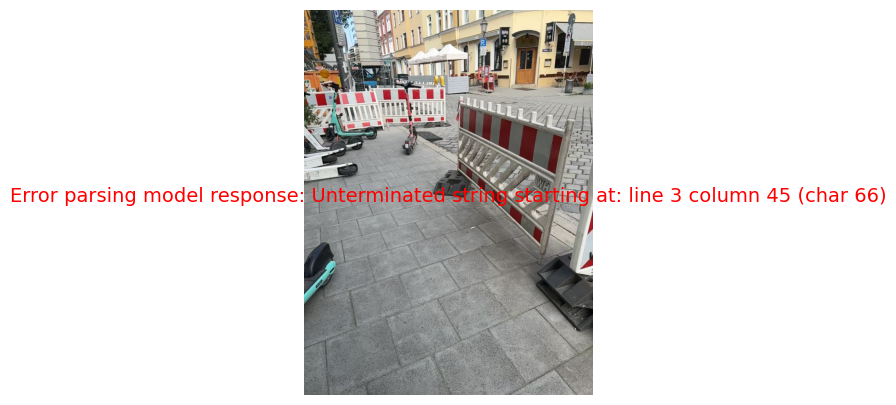

In [146]:
# Example usage:
MODEL_ID = "gemini-2.5-flash-preview-04-17"
# img = Image.open(example_images_dir / "kitchen.jpg")
img = Image.fromarray(ds.get_rgb(300))
fig = visualize_scene_with_segmentation_and_3d_boxes(client, MODEL_ID, img)

### Other examples

Expend the next sub-section to see more examples of images and prompts you can use. Experiment with them and find what works bets for your use-case.

#### Find appliances instead of furniture

## What's next?

For a more end-to-end example, the code from the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com) is available on [GitHub](https://github.com/google-gemini/starter-applets/tree/main/spatial).

Related to image recognition and reasoning, other than the [2D spatial understanding](../quickstarts/Spatial_understanding.ipynb) notebook, [Market a jet backpack](../examples/Market_a_Jet_Backpack.ipynb) and [Guess the shape](../examples/Guess_the_shape.ipynb) examples are worth checking to continue exploring the capabilities of Gemini (Note: These use the old SDK).

Other Gemini 2.0 examples are available in the [Gemini 2.0 cookbook](../gemini-2/). The [video understanding](../quickstarts/Video_understanding.ipynb), [audio streaming (right from Colab)](../gemini-2/websockets/live_api_streaming_in_colab.ipynb) and [multiple tools](../examples/LiveAPI_plotting_and_mapping.ipynb) examples are in particular worth checking if you are interested in advanced capabilities of the model.